# <center> Tutorial: Raster manipulation with Python

In this notebook, we practice manipulating satellite imagery with python. We show how to open rasters in TIF format and manipulate formats and color channels. We also show how to manipulate GeoJSON files and shapely polygons using Geopandas, and how to plot all this stuff with the relevant libraries.

The data we used are images from the Duke dataset and polygons from an OSM extract (see corresponding notebooks for detailed analysis of Duke and OSM data).

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#TIF-images" data-toc-modified-id="TIF-images-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>TIF images</a></span></li><li><span><a href="#GeoJSON-files" data-toc-modified-id="GeoJSON-files-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>GeoJSON files</a></span></li><li><span><a href="#Shapely-and-Geopandas-objects" data-toc-modified-id="Shapely-and-Geopandas-objects-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Shapely and Geopandas objects</a></span></li><li><span><a href="#XML-files" data-toc-modified-id="XML-files-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>XML files</a></span></li></ul></div>

In [45]:
# file manipulation imports
import pandas as pd
import os
import pickle
import json
import geojson
from geojson import Point, Feature, FeatureCollection, dump
import geopandas as gpd
from shapely.geometry import Polygon, Point, asShape, mapping, shape
import cv2
import rasterio
from rasterio.plot import reshape_as_image, show
from xml.etree import ElementTree

# visualization imports
import matplotlib.pyplot as plt
%matplotlib inline
import folium
from folium import IFrame
from folium.plugins import MarkerCluster
import geojsonio

## TIF images

* Read TIF as numpy array using `OpenCV`:

In [3]:
im = cv2.imread('Duke/3385789/10sfg735670.tif', -1)
im

array([[[191, 213, 220],
        [186, 203, 212],
        [192, 209, 215],
        ...,
        [121, 138, 146],
        [119, 137, 153],
        [109, 130, 139]],

       [[194, 220, 229],
        [186, 208, 216],
        [190, 209, 215],
        ...,
        [117, 137, 150],
        [123, 139, 154],
        [115, 134, 147]],

       [[193, 215, 224],
        [189, 208, 217],
        [189, 206, 214],
        ...,
        [113, 136, 147],
        [123, 136, 154],
        [117, 136, 153]],

       ...,

       [[ 85, 103,  89],
        [ 92, 108,  91],
        [ 82,  99,  63],
        ...,
        [127, 141, 144],
        [128, 134, 144],
        [125, 135, 146]],

       [[ 82, 107,  91],
        [ 81,  80,  74],
        [ 84,  95,  79],
        ...,
        [129, 141, 142],
        [128, 134, 143],
        [125, 134, 144]],

       [[ 90, 139, 109],
        [ 90, 138, 105],
        [ 95, 142, 116],
        ...,
        [133, 142, 144],
        [126, 133, 141],
        [126, 134, 144]]

* Read and manipulate TIF with `rasterio`:

In [35]:
image1 = rasterio.open('../Data/Duke/3385789/10sfg735670.tif')

In [4]:
#Image dimension in meters as well rows and columns:

width_in_projected_units = image1.bounds.right - image1.bounds.left
height_in_projected_units = image1.bounds.top - image1.bounds.bottom
print("Width: {}, Height: {}".format(width_in_projected_units, height_in_projected_units))
print("Rows: {}, Columns: {}".format(image1.height, image1.width))

Width: 1500.0, Height: 1500.0
Rows: 5000, Columns: 5000


In [5]:
#Pixel conversion to latitude and longitude:

# Upper left pixel
row_min = 0
col_min = 0
# Lower right pixel.  Rows and columns are zero indexing.
row_max = image1.height - 1
col_max = image1.width - 1
# Transform coordinates with the dataset's affine transformation.
topleft = image1.transform * (row_min, col_min)
botright = image1.transform * (row_max, col_max)
print("Top left corner coordinates: {}".format(topleft))
print("Bottom right corner coordinates: {}".format(botright))

Top left corner coordinates: (673500.0, 4168500.0)
Bottom right corner coordinates: (674999.7, 4167000.3)


In [6]:
#Storing the bands(B,G,R) in numpy array:

print(image1.count)
# sequence of band indexes
print(image1.indexes)

3
(1, 2, 3)


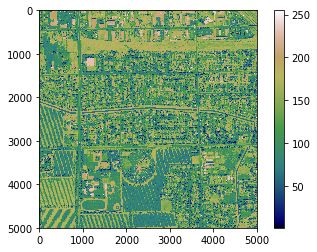

In [14]:
# Load the 3 bands into 2d arrays
b, g, r = image1.read()
# Displaying the blue band.
fig = plt.imshow(b)
fig.set_cmap('gist_earth')
plt.colorbar()
plt.show()

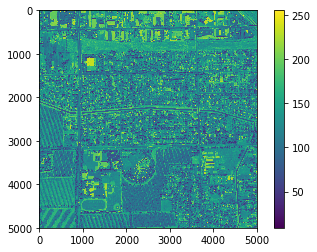

In [13]:
# Displaying the green band.
fig = plt.imshow(g)
plt.colorbar()
plt.show()

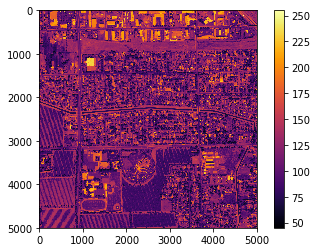

In [12]:
# Displaying the red band.
fig = plt.imshow(r)
fig.set_cmap('inferno')
plt.colorbar()
plt.show()

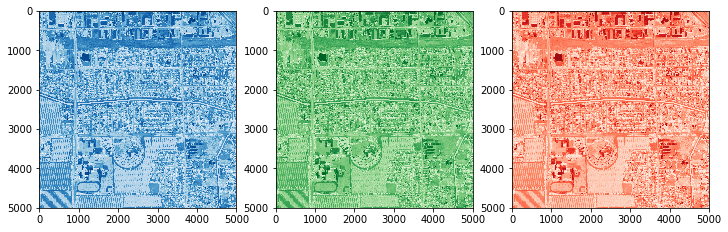

In [51]:
# plot bands with rasterio's plot.show method, in different color shades
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
show(b, ax=ax1, cmap='Blues')
show(g, ax=ax2, cmap='Greens')
show(r, ax=ax3, cmap='Reds')
plt.show()

In [36]:
with rasterio.open('../Data/Duke/3385789/10sfg735685.tif') as src:
    raster_img = src.read() #sub-element in object stored with the "open" command
    raster_meta = src.meta #sub-element in object stored with the "open" command

In [18]:
#Checking raster shape and Meta
raster_meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': None,
 'width': 5000,
 'height': 5000,
 'count': 3,
 'crs': CRS({'init': 'epsg:26910'}),
 'transform': Affine(0.3, 0.0, 673500.0,
        0.0, -0.3, 4170000.0)}

In [19]:
print(raster_img.shape)

(3, 5000, 5000)


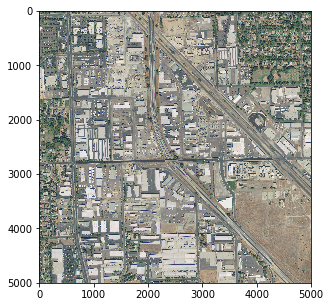

In [26]:
#Using rasterio reshape to plot an image in matplotlib

image2 = reshape_as_image(raster_img)
plt.figure(figsize=(5,5))
plt.imshow(image2)

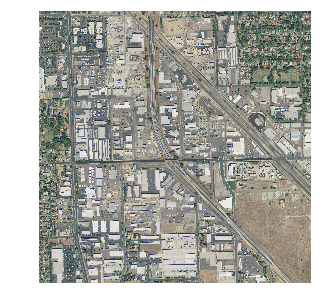

In [47]:
#Using rasterio show to plot an image in matplotlib

fig, ax = plt.subplots(1, figsize=(5, 5))
show(raster_img, ax=ax)
ax.set_axis_off()
plt.show()

In [37]:
# change pixel format (convert to float32)
img3 = raster_img.astype("f4")
img3

array([[[ 73.,  71.,  72., ...,  87.,  80.,  97.],
        [ 74.,  73.,  75., ...,  80.,  76.,  93.],
        [ 75.,  75.,  74., ...,  82.,  85.,  92.],
        ...,
        [224., 222., 213., ..., 149., 153., 138.],
        [217., 221., 219., ..., 156., 150., 137.],
        [212., 214., 219., ..., 152., 150., 138.]],

       [[106., 101., 103., ..., 125., 116., 130.],
        [110., 106., 108., ..., 121., 110., 128.],
        [111., 109., 111., ..., 120., 118., 126.],
        ...,
        [214., 214., 208., ..., 137., 131., 127.],
        [208., 212., 212., ..., 139., 130., 127.],
        [205., 205., 211., ..., 139., 135., 127.]],

       [[ 93.,  91.,  88., ...,  89.,  87.,  90.],
        [ 89.,  91.,  90., ...,  85.,  84.,  87.],
        [ 89.,  89.,  90., ...,  84.,  87.,  90.],
        ...,
        [191., 193., 189., ..., 110., 112., 103.],
        [191., 190., 192., ..., 117., 112., 104.],
        [189., 185., 193., ..., 123., 118., 106.]]], dtype=float32)

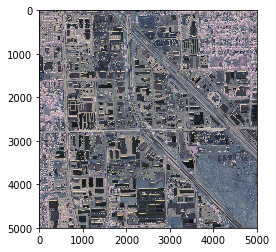

In [56]:
img3 = reshape_as_image(img3)
plt.imshow(img3);

In [55]:
# change pixel format (convert to uint8)
r_uint8 = r.astype(rasterio.uint8)
print(r_uint8.dtype)

uint8


In [59]:
# get subset of an image, using `window(col_off, row_off, width, height)`:
src = rasterio.open('../Data/Duke/3385789/10sfg735685.tif')
window = rasterio.windows.Window(1200, 1200, 750, 850)
subset = src.read(window=window)
subset.shape

(3, 850, 750)

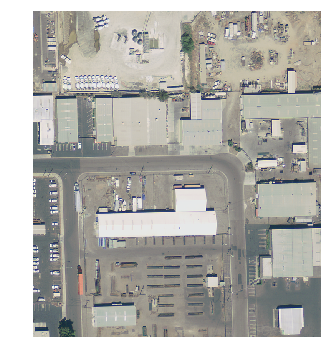

In [60]:
fig, ax = plt.subplots(1, figsize=(6, 6))
show(subset, ax=ax)
ax.set_axis_off()
plt.show()

## GeoJSON files

* Read GeoJSON labels with `geopandas`

In [26]:
# Reading train labels with geopandas

train_df = gpd.read_file("../Data/Duke/3385780/SolarArrayPolygons.geojson")
print(len(train_df))
train_df.head(5)

19433


,polygon_id,centroid_latitude,centroid_longitude,centroid_latitude_pixels,centroid_longitude_pixels,city,area_pixels,area_meters,image_name,nw_corner_of_image_latitude,nw_corner_of_image_longitude,se_corner_of_image_latitude,se_corner_of_image_longitude,datum,projection_zone,resolution,jaccard_index,polygon_vertices_pixels,geometry
0,1,36.926310,-119.840555,107.618458,3286.151487,Fresno,136.192872,1513.254134,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.914020,"[ [ 3360.4950690000001, 131.6311637 ], [ 3249....","POLYGON ((-119.84030 36.92625, -119.84068 36.9..."
1,2,36.926477,-119.840561,45.977659,3286.352946,Fresno,155.511714,1727.907934,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.829071,"[ [ 3361.1538460000002, 69.61538462 ], [ 3217....","POLYGON ((-119.84031 36.92642, -119.84080 36.9..."
2,3,36.926542,-119.840506,22.280851,3303.465657,Fresno,111.796591,1242.184349,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.937961,"[ [ 3358.0157260000001, 48.136863220000002 ], ...","POLYGON ((-119.84032 36.92648, -119.84032 36.9..."
3,4,36.921008,-119.842847,2048.362567,2547.366116,Fresno,62.004008,688.933420,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.842634,"[ [ 2571.5917159999999, 2068.0493099999999 ], ...","POLYGON ((-119.84276 36.92096, -119.84277 36.9..."
4,5,36.920976,-119.842906,2060.014890,2529.504997,Fresno,95.480150,1060.890554,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.890998,"[ [ 2563.7810650000001, 2091.3984220000002 ], ...","POLYGON ((-119.84279 36.92089, -119.84299 36.9..."


In [29]:
# count features present in the geojson file
train_df.count()

polygon_id                      19433
centroid_latitude               19433
centroid_longitude              19433
centroid_latitude_pixels        19433
centroid_longitude_pixels       19433
city                            19433
area_pixels                     19433
area_meters                     19433
image_name                      19433
nw_corner_of_image_latitude     19433
nw_corner_of_image_longitude    19433
se_corner_of_image_latitude     19433
se_corner_of_image_longitude    19433
datum                           19433
projection_zone                 19433
resolution                      19433
jaccard_index                   19433
polygon_vertices_pixels         19433
geometry                        19433
centroid                        19433
dtype: int64

In [27]:
#Checking coordinates of polygon using Polygon methods
print(list(train_df['geometry'][0].exterior.coords))
train_df['geometry'][0].exterior.coords.xy

[(-119.84030285285368, 36.92625126752494), (-119.84068167074253, 36.92636019465177), (-119.84080234595001, 36.9263955197238), (-119.840812638602, 36.926373374881805), (-119.84080600233547, 36.926371412835486), (-119.8408066470241, 36.92636992246358), (-119.84031836310277, 36.92622672990362), (-119.84030285285368, 36.92625126752494)]


(array('d', [-119.84030285285368, -119.84068167074253, -119.84080234595001, -119.840812638602, -119.84080600233547, -119.8408066470241, -119.84031836310277, -119.84030285285368]),
 array('d', [36.92625126752494, 36.92636019465177, 36.9263955197238, 36.926373374881805, 36.926371412835486, 36.92636992246358, 36.92622672990362, 36.92625126752494]))

In [28]:
# add centroids in order to have unique coordinates for each way
train_df2 = train_df
train_df2['centroid'] = train_df2['geometry'].centroid
train_df2.head(1)

# we can also get separately lat and lon of centroid with:
# train_df2["centroid_lon"] = train_df2['geometry'].centroid.x
# train_df2["centroid_lat"] = train_df2['geometry'].centroid.y

,polygon_id,centroid_latitude,centroid_longitude,centroid_latitude_pixels,centroid_longitude_pixels,city,area_pixels,area_meters,image_name,nw_corner_of_image_latitude,nw_corner_of_image_longitude,se_corner_of_image_latitude,se_corner_of_image_longitude,datum,projection_zone,resolution,jaccard_index,polygon_vertices_pixels,geometry,centroid
0,1,36.92631,-119.840555,107.618458,3286.151487,Fresno,136.192872,1513.254134,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.91402,"[ [ 3360.4950690000001, 131.6311637 ], [ 3249....","POLYGON ((-119.84030 36.92625, -119.84068 36.9...",POINT (-119.84056 36.92631)


In [8]:
#function to check if a given point is located inside a given polygon
def point_inside_polygon(lat,lng,poly):
    n = len(poly)
    inside =False
    p1x,p1y = poly[0]
    for i in range(n+1):
        p2x,p2y = poly[i % n]
        if lat > min(p1y,p2y):
            if lat <= max(p1y,p2y):
                if lng <= max(p1x,p2x):
                    if p1y != p2y:
                        xinters = (lat-p1y)*(p2x-p1x)/(p2y-p1y)+p1x
                    if p1x == p2x or lng <= xinters:
                        inside = not inside
        p1x,p1y = p2x,p2y
    return inside

In [2]:
#convert back to geojson
train_df = train_df.head(10)
train_df_geo = train_df.to_json()

# write to disk
with open('../Data/OSM_coord/newfile.geojson', 'w') as f:
    dump(train_df_geo, f)

* Visualise GeoJSON on a map in browser with `geojsonio`:

In [3]:
#visualise geojson in browser
geojsonio.display(train_df_geo)

'http://geojson.io/#data=data:application/json,%7B%22type%22%3A%20%22FeatureCollection%22%2C%20%22features%22%3A%20%5B%7B%22id%22%3A%20%220%22%2C%20%22type%22%3A%20%22Feature%22%2C%20%22properties%22%3A%20%7B%22area_meters%22%3A%201513.254134%2C%20%22area_pixels%22%3A%20136.192872%2C%20%22centroid_latitude%22%3A%2036.926310139710594%2C%20%22centroid_latitude_pixels%22%3A%20107.6184581%2C%20%22centroid_longitude%22%3A%20-119.84055537864529%2C%20%22centroid_longitude_pixels%22%3A%203286.151487%2C%20%22city%22%3A%20%22Fresno%22%2C%20%22datum%22%3A%20%22NAD83%22%2C%20%22image_name%22%3A%20%2211ska460890%22%2C%20%22jaccard_index%22%3A%200.914019659%2C%20%22nw_corner_of_image_latitude%22%3A%2036.92633611%2C%20%22nw_corner_of_image_longitude%22%3A%20-119.8516222%2C%20%22polygon_id%22%3A%201%2C%20%22polygon_vertices_pixels%22%3A%20%22%5B%20%5B%203360.4950690000001%2C%20131.6311637%20%5D%2C%20%5B%203249.1977099999999%2C%2087.985140549999997%20%5D%2C%20%5B%203213.75%2C%2073.849999999999994%20%5D

## Shapely and Geopandas objects

We show functions to manipulate and plot shapely points and polygons, based on data extracted from OSM (see corresponding notebook).

In [12]:
# open pickle file
with open('../Data/OSM_coord/uk_panels.pkl', 'rb') as f:
             osm_queried_panels = pickle.load(f)

In [9]:
# Convert to dataframe
osm_df = pd.DataFrame(osm_queried_panels)
osm_df.head(1)

,type,id,nodes,tags,lat,lon
0,way,21819997,"[235214393, 718952965, 718952985, 718952926, 7...","{'PMSA_ref': 'WMbiBIxx207', 'architect': 'Faul...",NaN,NaN


In [10]:
# Convert to geo dataframe
osm_df['geometry'] = list(zip(osm_df['lon'], osm_df['lat']))
osm_df['geometry'] = osm_df['geometry'].apply(lambda x: Point(x))
osm_df = gpd.GeoDataFrame(osm_df, crs={'init': 'epsg:4326'}) # OSM comes in this coordinate system
osm_df.head(1)

,type,id,nodes,tags,lat,lon,geometry
0,way,21819997,"[235214393, 718952965, 718952985, 718952926, 7...","{'PMSA_ref': 'WMbiBIxx207', 'architect': 'Faul...",NaN,NaN,POINT (nan nan)


In [11]:
# Change crs (British National Grid) for plotting
osm_bng = osm_df.to_crs({'init':'epsg:27700'})

In [13]:
# Grab UK outline (crs epsg:4326) and change to BNG coordinates
gb_outline = gpd.read_file('../Data/OSM_coord/GBR_adm/GBR_adm1.shp').to_crs({'init':'epsg:27700'})

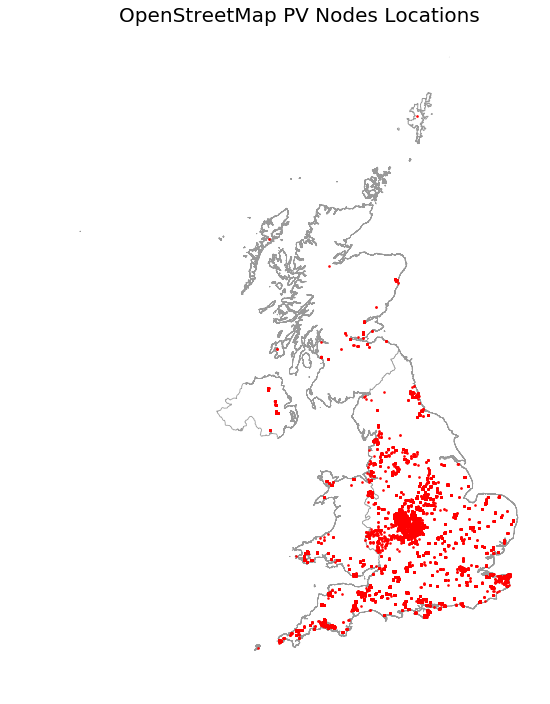

In [14]:
# Plot (static)
fig, ax = plt.subplots(1, figsize=(12, 12))
gb_outline.plot(ax=ax, color='white', linewidth=0.8, edgecolor='0.6')
osm_bng.plot(ax=ax, markersize=2, color='red', alpha=0.4)

ax.set_title("OpenStreetMap PV Nodes Locations", fontdict={'fontsize': '20', 'fontweight' : '3'})
ax.axis('off')
plt.show()

In [16]:
# Plot (interactive), with folium
# The popups attribute makes sure we can click on points to see coordinates

# Store all nodes coordinates for plotting
osm_folium = osm_df[osm_df.lat.notna()]
print(len(osm_folium))
osm_folium.head(1)

# Plot
m = folium.Map([50.751, -1.9950], zoom_start=6, tiles='cartodbpositron')
# other possible tile styles: ["Stamen Terrain", "Stamen Toner", "Mapbox Bright"]

locations = []
popups = []
for idx, row in osm_folium[:10000].iterrows():
    locations.append([row['geometry'].y, row['geometry'].x])
    popups.append((row['geometry'].y, row['geometry'].x))

s = folium.FeatureGroup(name='Solar PV')
s.add_children(MarkerCluster(locations=locations, popups=popups))
m.add_children(s)
m.add_child(folium.LatLngPopup())

85241


In [19]:
# convert summit coordinates to Polygon shapely object
summits = [[52.460309, -1.8446924], [52.4601234, -1.8443053], [52.4601571, -1.8442619], [52.4600219, -1.8439798], [52.4600585, -1.8439325], [52.4599617, -1.8437306], [52.4600288, -1.8436439], [52.4599427, -1.8434643], [52.4595284, -1.8439991], [52.4595503, -1.8440447], [52.4594302, -1.8441997], [52.4594666, -1.8442756], [52.4595603, -1.8441546], [52.4596269, -1.8442934], [52.4594333, -1.8445433], [52.4594825, -1.844646], [52.4596214, -1.8444667], [52.4597635, -1.844763], [52.4598029, -1.8447121], [52.4599905, -1.8451036], [52.460309, -1.8446924]]
polygon = Polygon(summits)
print(type(polygon))
print(polygon)

<class 'shapely.geometry.polygon.Polygon'>
POLYGON ((52.460309 -1.8446924, 52.4601234 -1.8443053, 52.4601571 -1.8442619, 52.4600219 -1.8439798, 52.4600585 -1.8439325, 52.4599617 -1.8437306, 52.4600288 -1.8436439, 52.4599427 -1.8434643, 52.4595284 -1.8439991, 52.4595503 -1.8440447, 52.4594302 -1.8441997, 52.4594666 -1.8442756, 52.4595603 -1.8441546, 52.4596269 -1.8442934, 52.4594333 -1.8445433, 52.4594825 -1.844646, 52.4596214 -1.8444667, 52.4597635 -1.844763, 52.4598029 -1.8447121, 52.4599905 -1.8451036, 52.460309 -1.8446924))


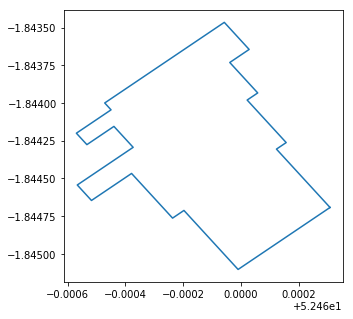

In [20]:
# plot shapely object
plt.figure(figsize=(5,5))
plt.plot(*polygon.exterior.xy)
plt.show()

In [21]:
# convert shapely object to geodataframe
polygon_geo = gpd.GeoDataFrame(index=[0], crs={'init': 'epsg:4326'}, geometry=[polygon])
type(polygon_geo)

geopandas.geodataframe.GeoDataFrame

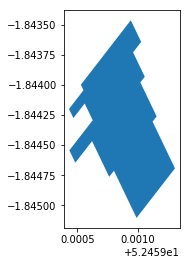

In [22]:
# plot geodataframe with axes
polygon_geo.plot()
plt.show()

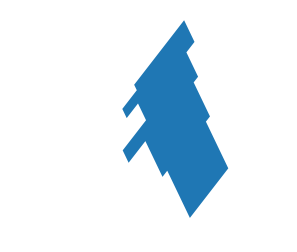

In [23]:
# plot geodataframe without axes
f, ax = plt.subplots(1, figsize=(4, 4))
ax = polygon_geo.plot(axes=ax)
ax.set_axis_off() # to remove axes
lims = plt.axis('equal') # to center / not distort the shape
plt.show()

In [31]:
# convert back geodataframe row to shapely polygon
polygon = None
for i in polygon_geo['geometry'][0:1]:
    polygon = i
type(polygon)

shapely.geometry.polygon.Polygon

We could then use folium to plot the polygon directly on a map, or convert the geodataframe to geojson format and plot it using geojsonio (see previous sections).

## XML files

* Parse XML annotation file using `xml.etree` (doesn't really correspond to our use case, but could be useful to extract boxes or polygon shapes from an xml text file):

In [39]:
# function to extract bounding boxes from an annotation file

def extract_boxes(filename):
	# load and parse the file
	tree = ElementTree.parse(filename)
	# get the root of the document
	root = tree.getroot()
	# extract each bounding box
	boxes = list()
	for box in root.findall('.//bounding'):
		xmin = int(box.find('xmin').text)
		ymin = int(box.find('ymin').text)
		xmax = int(box.find('xmax').text)
		ymax = int(box.find('ymax').text)
		coors = [xmin, ymin, xmax, ymax]
		boxes.append(coors)
	# extract image dimensions
	width = int(root.find('.//size/width').text)
	height = int(root.find('.//size/height').text)
	return boxes, width, height
 
# extract details form annotation file
boxes, w, h = extract_boxes('<file>.xml')
# summarize extracted details (w and h are width and height of photograph)
print(boxes, w, h)